In [1]:
!pip install pydicom

In [2]:
import os
import numpy as np
import pydicom
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import random
import matplotlib.pyplot as plt

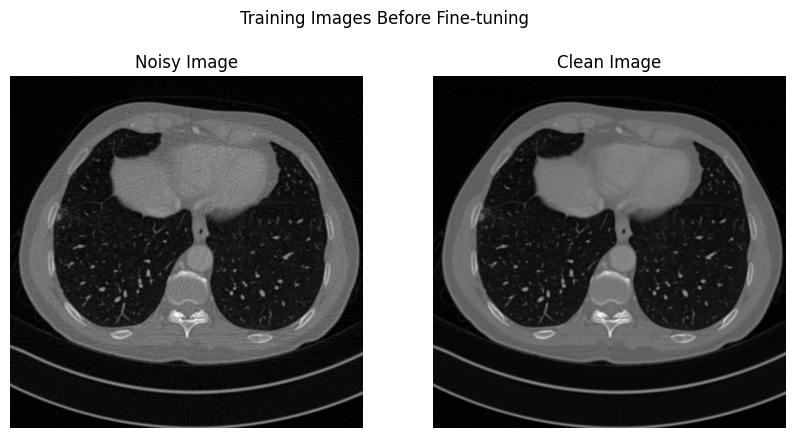

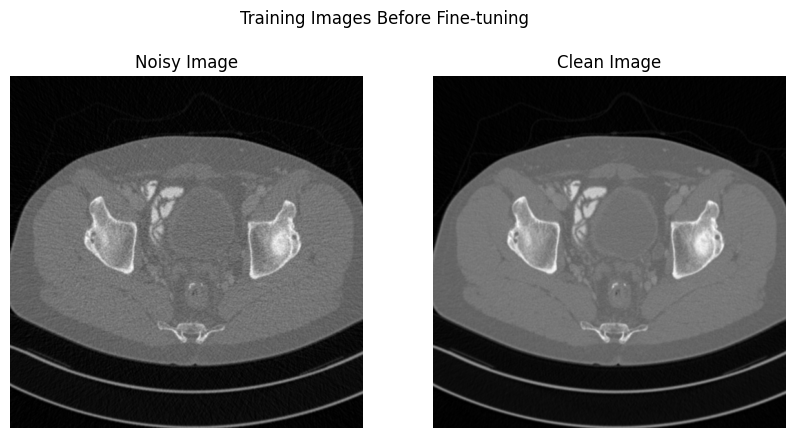

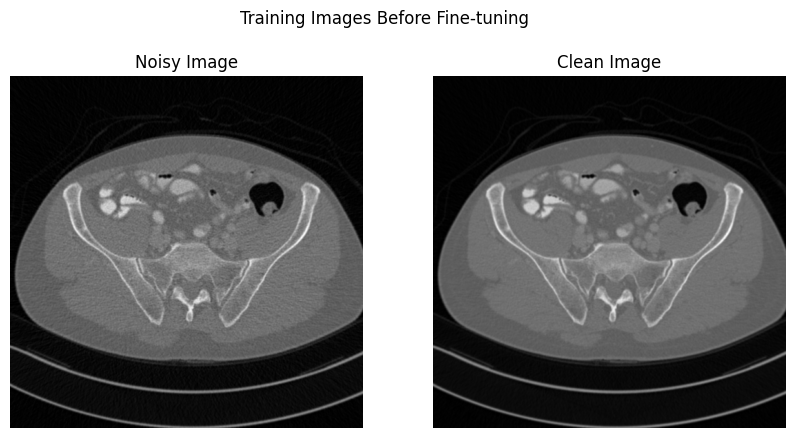

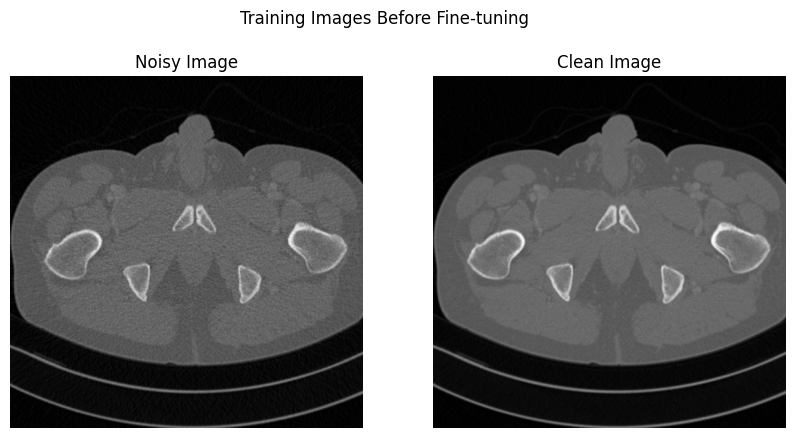

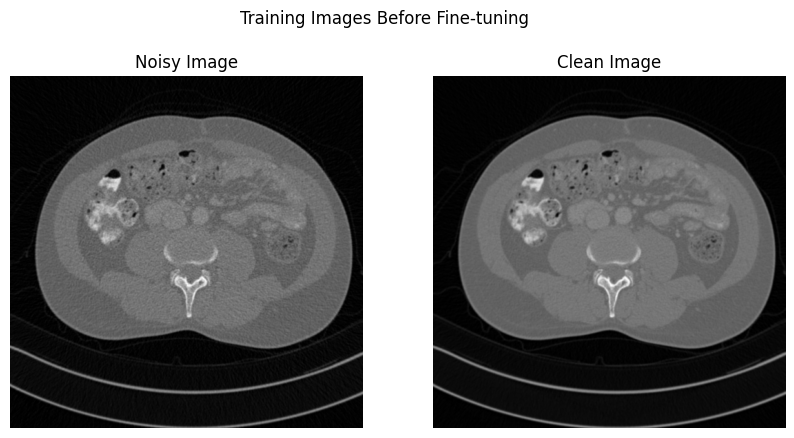

...

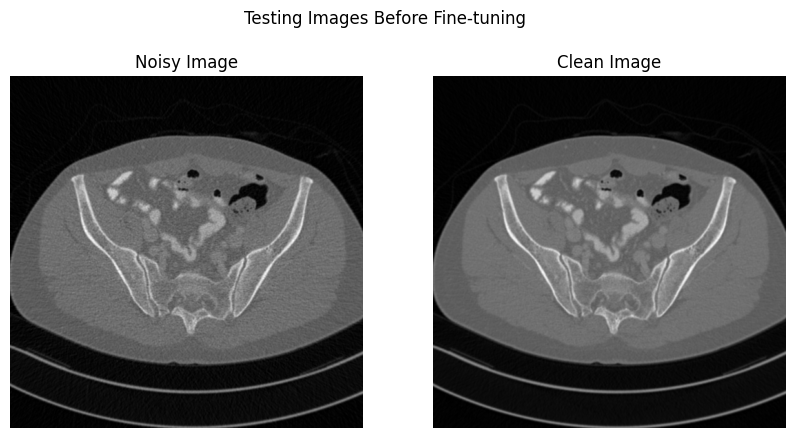

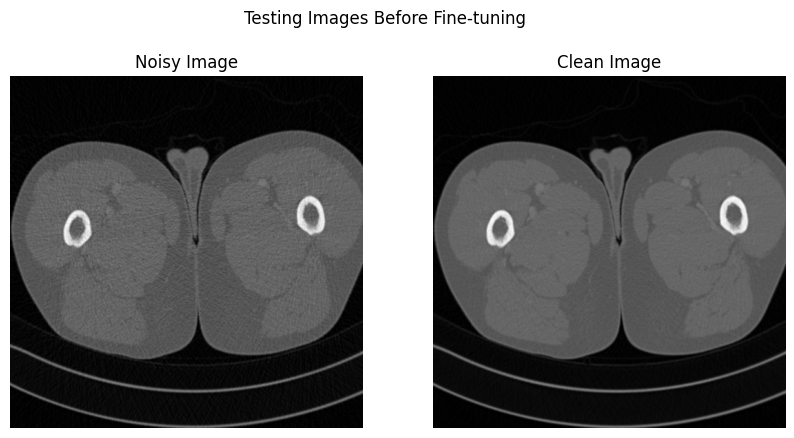

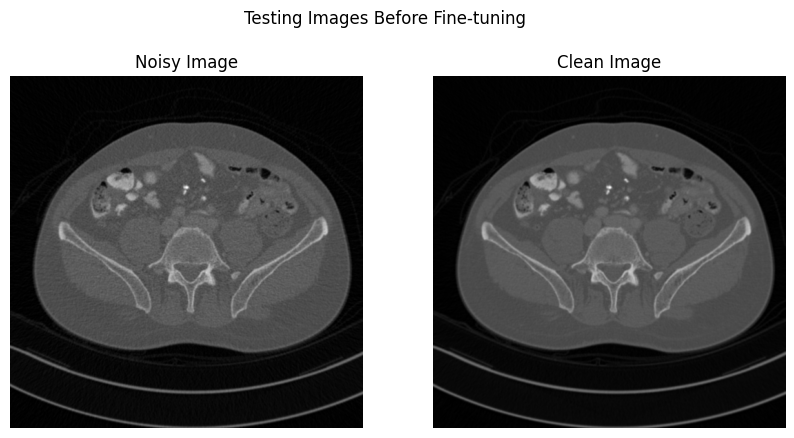

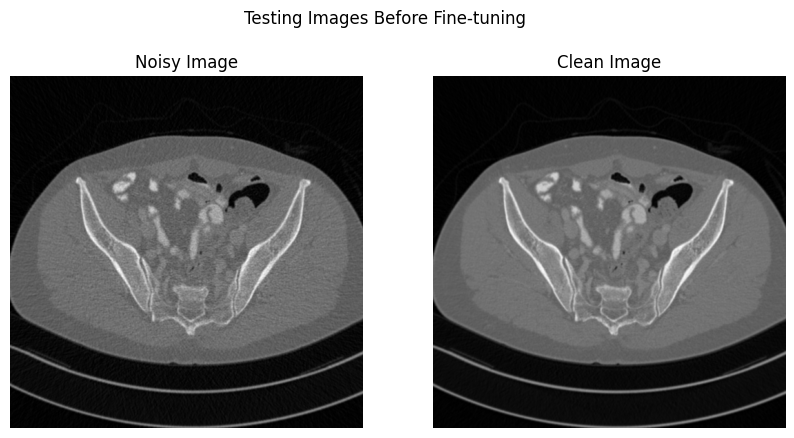

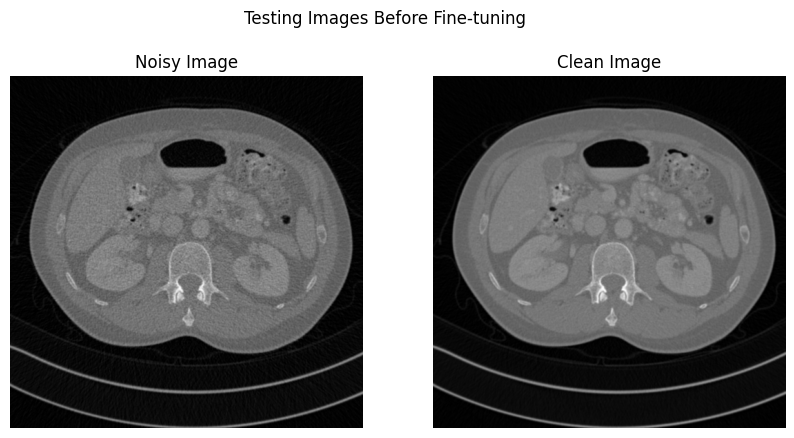

In [25]:
# Load .ima (DICOM-like) images
def load_ima_image(image_path):
    dicom_image = pydicom.dcmread(image_path)
    pixel_array = dicom_image.pixel_array
    # Normalize pixel values to [0, 1]
    pixel_array = (pixel_array - np.min(pixel_array)) / (np.max(pixel_array) - np.min(pixel_array))
    # Convert to 3-channel image if needed
    if len(pixel_array.shape) == 2:  # If grayscale
        pixel_array = np.stack([pixel_array] * 3, axis=-1)  # Convert grayscale to RGB
    return torch.tensor(pixel_array).permute(2, 0, 1)  # Convert to (C, H, W) format

# Custom Dataset for .ima images
class IMAImageDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir, transform=None):
        self.noisy_dir = noisy_dir
        self.clean_dir = clean_dir
        self.transform = transform
        self.noisy_images = os.listdir(noisy_dir)
        self.clean_images = os.listdir(clean_dir)
        
        # Sort images for correct mapping (relying on similar naming convention)
        self.noisy_images.sort()
        self.clean_images.sort()

    def __len__(self):
        return len(self.noisy_images)

    def __getitem__(self, idx):
        noisy_image_path = os.path.join(self.noisy_dir, self.noisy_images[idx])
        clean_image_path = os.path.join(self.clean_dir, self.clean_images[idx])

        noisy_image = load_ima_image(noisy_image_path)
        clean_image = load_ima_image(clean_image_path)

        if self.transform:
            noisy_image = self.transform(noisy_image.numpy())  # Convert tensor to numpy for transformations
            clean_image = self.transform(clean_image.numpy())

        return noisy_image, clean_image

# Display noisy and clean images
def show_images(noisy_imgs, clean_imgs, title="Testing Images Before Fine-tuning"):
    # Unpack the single image tensors from the batch
    noisy_img = noisy_imgs[0]  # Because batch_size = 1
    clean_img = clean_imgs[0]

    # Convert from PyTorch tensor to NumPy for display
    noisy_np = noisy_img.permute(1, 2, 0).cpu().numpy()  # Convert from [C, H, W] to [H, W, C]
    clean_np = clean_img.permute(1, 2, 0).cpu().numpy()

    # Display the images
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title)

    # Display noisy image
    axs[0].imshow(noisy_np, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Noisy Image')

    # Display clean image
    axs[1].imshow(clean_np, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Clean Image')

    plt.show()

# Set up the dataset and randomly select 20 images
noisy_images_dir = '/kaggle/input/quat1-zip/L067/quarter_1mm'
clean_images_dir = '/kaggle/input/full1-zip/L067 - Copy/full_1mm'
dataset = IMAImageDataset(noisy_images_dir, clean_images_dir)

# Randomly select 20 images
selected_indices = random.sample(range(len(dataset)), 35)
selected_dataset = torch.utils.data.Subset(dataset, selected_indices)

# Split the selected dataset into 15 for training and 5 for testing
train_size = 30
test_size = 5
train_dataset, test_dataset = random_split(selected_dataset, [train_size, test_size])

# Show the images before fine-tuning
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Display training images
for noisy_imgs, clean_imgs in train_loader:
    show_images(noisy_imgs, clean_imgs, title="Training Images Before Fine-tuning")

# Display testing images
for noisy_imgs, clean_imgs in test_loader:
    show_images(noisy_imgs, clean_imgs, title="Testing Images Before Fine-tuning")

In [9]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 28.0 MB/s eta 0:00:00a 0:00:01


In [10]:
import os
import pydicom
import torch
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from diffusers import UNet2DModel, DDIMScheduler

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [18]:
# train_size = 15
# test_size = 5
# train_dataset, test_dataset = random_split(selected_dataset, [train_size, test_size])

# # Show the images before fine-tuning
# train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
# test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

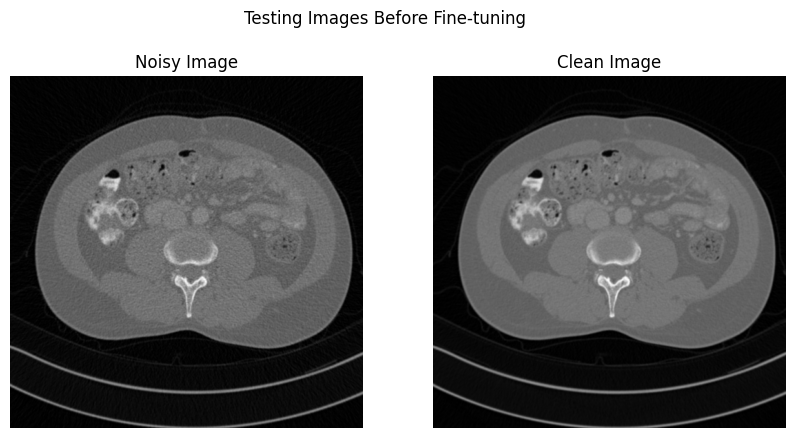

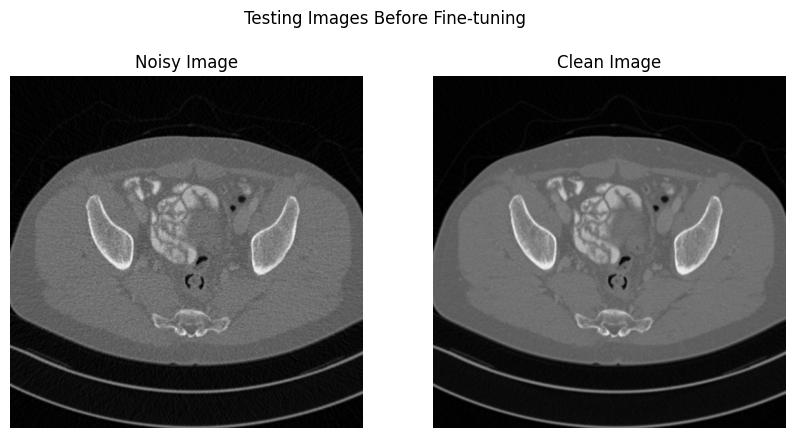

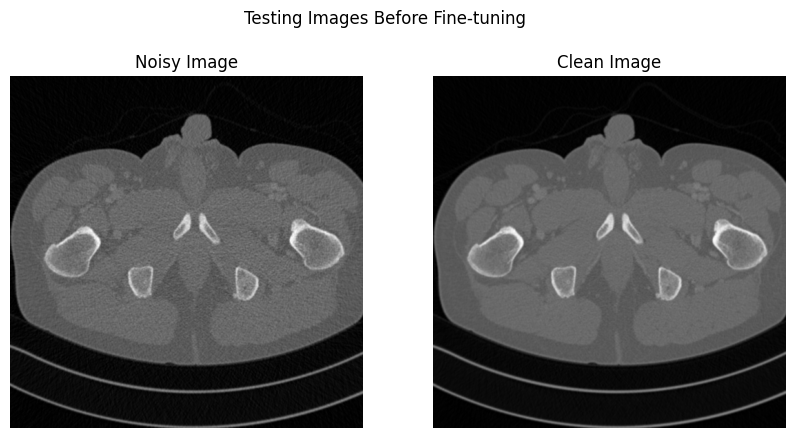

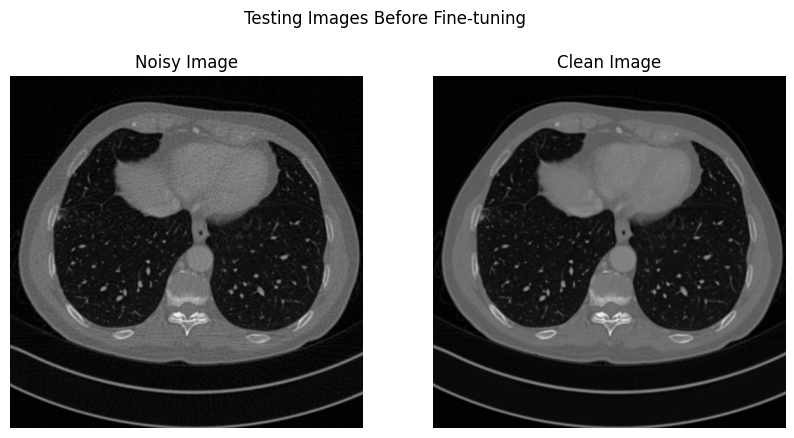

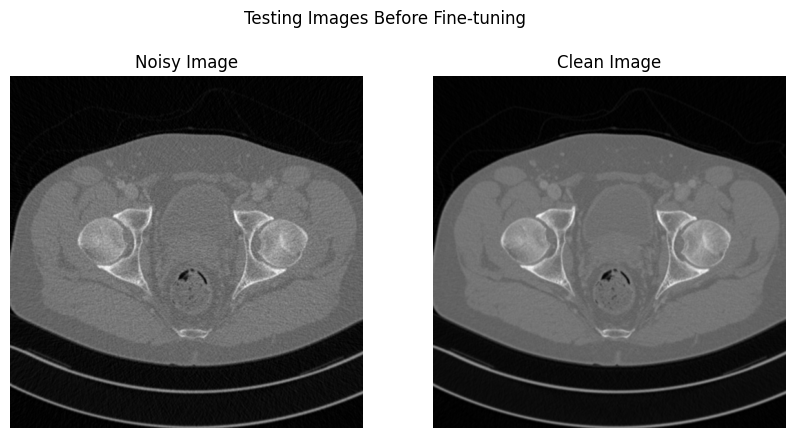

...

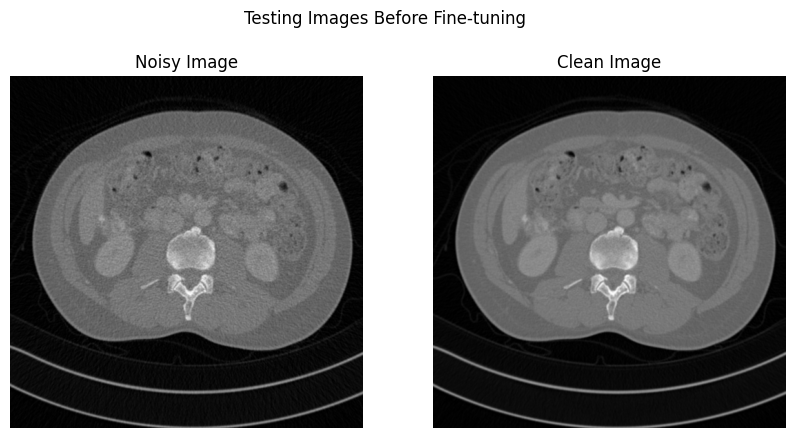

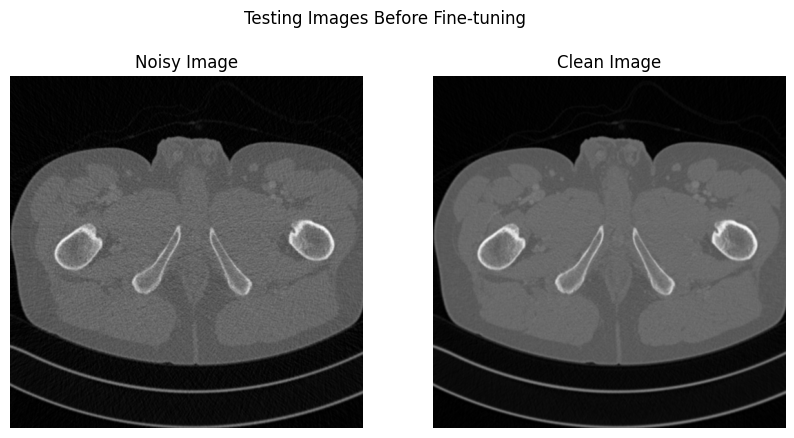

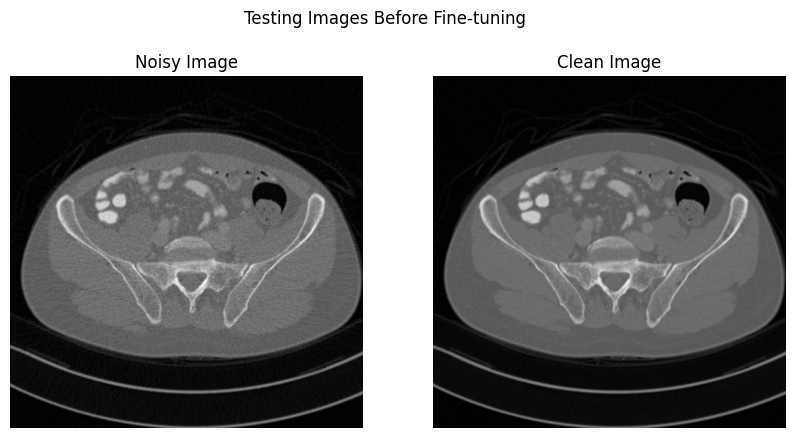

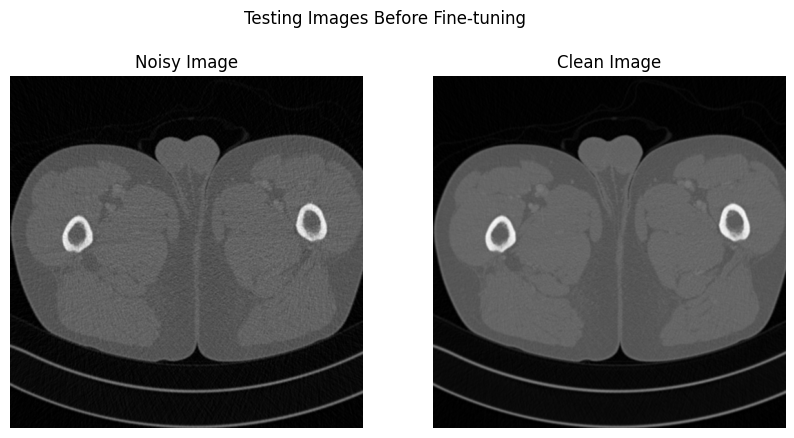

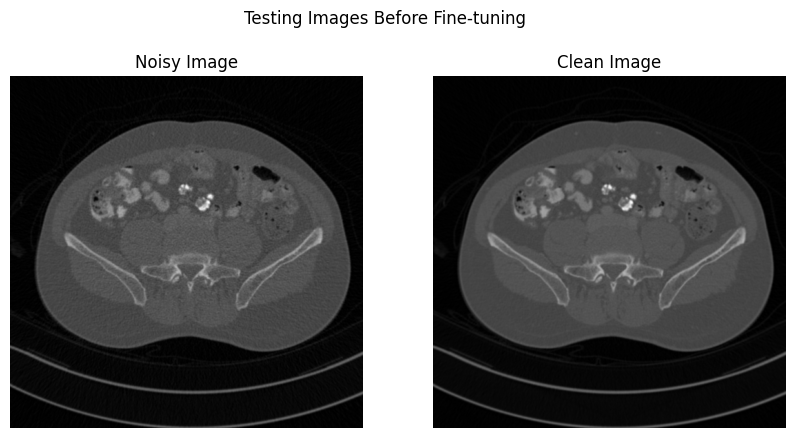

In [17]:
# for noisy_imgs, clean_imgs in DataLoader(train_dataset, batch_size=1, shuffle=True):
#     show_images(noisy_imgs, clean_imgs, title="Testing Images Before Fine-tuning")

In [26]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet2DModel.from_pretrained("google/ddpm-cifar10-32").to(device)
scheduler = DDIMScheduler.from_pretrained("google/ddpm-cifar10-32")

# Fine-tuning loop
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
num_epochs = 1

for epoch in range(num_epochs):
    model.train()
    for noisy_imgs, clean_imgs in train_loader:
        print("1")
        noisy_imgs = noisy_imgs.to(device).float()  # Convert to float
        clean_imgs = clean_imgs.to(device).float()  # Convert to float

        # Get current timestep (assume it is a random value for now)
        timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (noisy_imgs.size(0),), device=device)

        # Forward pass
        noise_pred = model(noisy_imgs, timesteps).sample

        # Compute the loss (mean squared error)
        loss = torch.nn.functional.mse_loss(noise_pred, clean_imgs)

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch + 1}/{num_epochs} - Loss: {loss.item()}")

# Save the fine-tuned model
model.save_pretrained("fine_tuned_ddim_model")

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
Epoch 1/1 - Loss: 0.0035311232786625624


In [20]:
# # Testing the model on 5 images
# test_dataset = IMAImageDataset(noisy_images_dir, clean_images_dir)
# test_dataloader = DataLoader(test_dataset, batch_size=5, shuffle=False)

# # Calculate PSNR, SIR, FSIM
# def calculate_metrics(noisy, clean, denoised):
#     psnr_value = cv2.PSNR(clean.cpu().numpy(), denoised.cpu().numpy())
#     # SIR and FSIM calculations should be implemented or imported
#     # Dummy values for SIR and FSIM
#     sir_value = np.random.random()  # Replace with actual SIR calculation
#     fsim_value = np.random.random()  # Replace with actual FSIM calculation
#     return psnr_value, sir_value, fsim_value

# model.eval()
# psnr_total = 0
# sir_total = 0
# fsim_total = 0
# with torch.no_grad():
#     for noisy_imgs, clean_imgs in test_dataloader:
#         noisy_imgs = noisy_imgs.to(device).float()
#         clean_imgs = clean_imgs.to(device).float()

#         # Get current timestep
#         timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (noisy_imgs.size(0),), device=device)

#         # Forward pass
#         denoised_imgs = model(noisy_imgs, timesteps).sample

#         # Calculate metrics for each image in the batch
#         for i in range(denoised_imgs.size(0)):
#             psnr, sir, fsim = calculate_metrics(noisy_imgs[i], clean_imgs[i], denoised_imgs[i])
#             psnr_total += psnr
#             sir_total += sir
#             fsim_total += fsim

# # Average metrics
# num_test_images = len(test_dataloader) * test_dataloader.batch_size
# print(f"Average PSNR: {psnr_total / num_test_images}")
# print(f"Average SIR: {sir_total / num_test_images}")
# print(f"Average FSIM: {fsim_total / num_test_images}")

NameError: name 'cv2' is not defined

In [11]:
# import matplotlib.pyplot as plt
# import torch
# from torch.utils.data import DataLoader

# # Load the test dataset
# # train_dataloader = DataLoader(train_dataset, batch_size=train_size, shuffle=False)
# # test_dataloader = DataLoader(test_dataset, batch_size=5, shuffle=False)

# # Function to display images
# def show_noisy_clean_images(noisy, clean, idx):
#     noisy_np = noisy.cpu().numpy().transpose(1, 2, 0)  # Assuming shape is (C, H, W)
#     clean_np = clean.cpu().numpy().transpose(1, 2, 0)

#     fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    
#     axs[0].imshow(noisy_np, cmap='gray')
#     axs[0].set_title('Noisy Image')
#     axs[0].axis('off')

#     axs[1].imshow(clean_np, cmap='gray')
#     axs[1].set_title('Clean Image')
#     axs[1].axis('off')

#     plt.suptitle(f'Image {idx}')
#     plt.show()

# # Display the first batch of noisy and clean images
# for batch_idx, (noisy_imgs, clean_imgs) in enumerate(test_loader):
#     noisy_imgs = noisy_imgs.to(device).float()
#     clean_imgs = clean_imgs.to(device).float()

#     for i in range(noisy_imgs.size(0)):
#         show_noisy_clean_images(noisy_imgs[i], clean_imgs[i], i + 1)

#     # Only show the first batch of 5 images
#     break


NameError: name 'device' is not defined

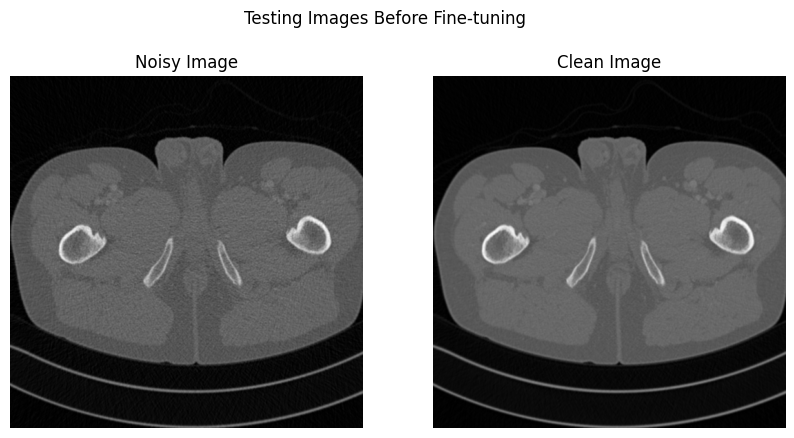

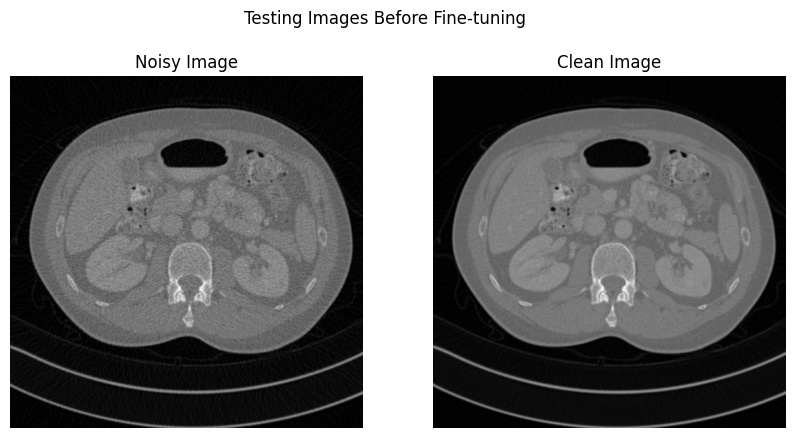

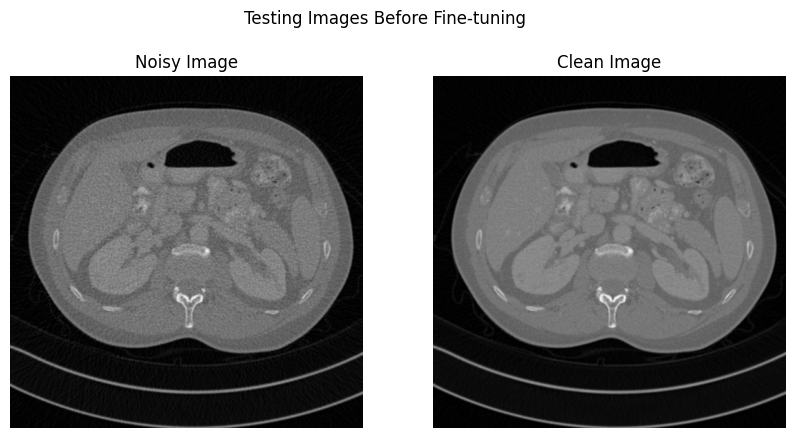

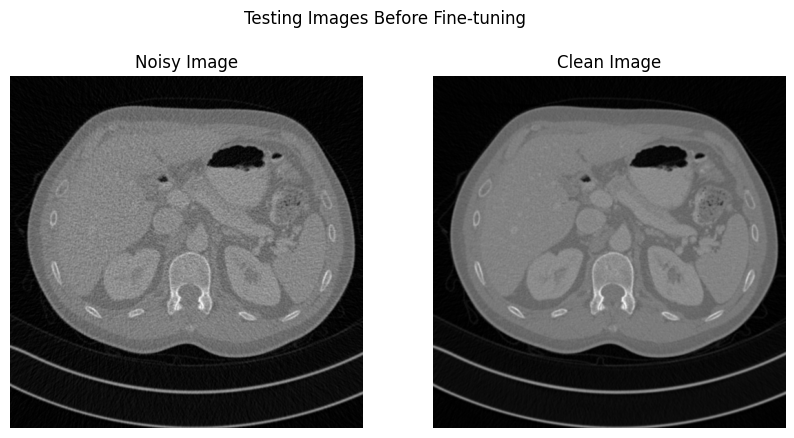

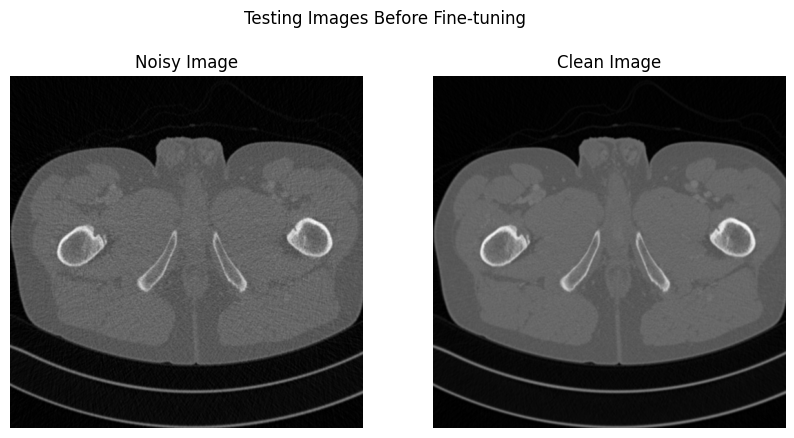

In [20]:
# for noisy_imgs, clean_imgs in test_loader:
#     show_images(noisy_imgs, clean_imgs, title="Testing Images Before Fine-tuning")

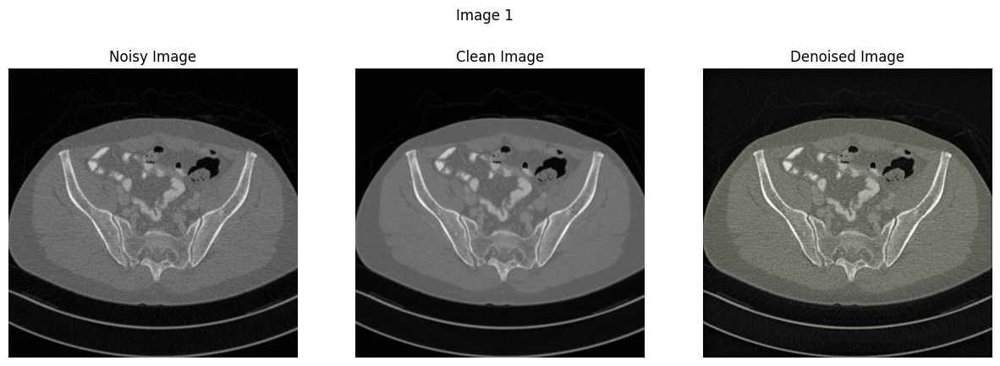

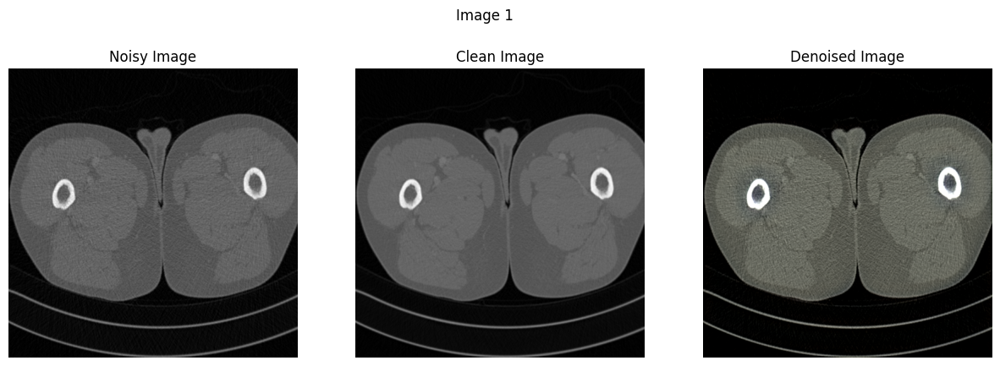

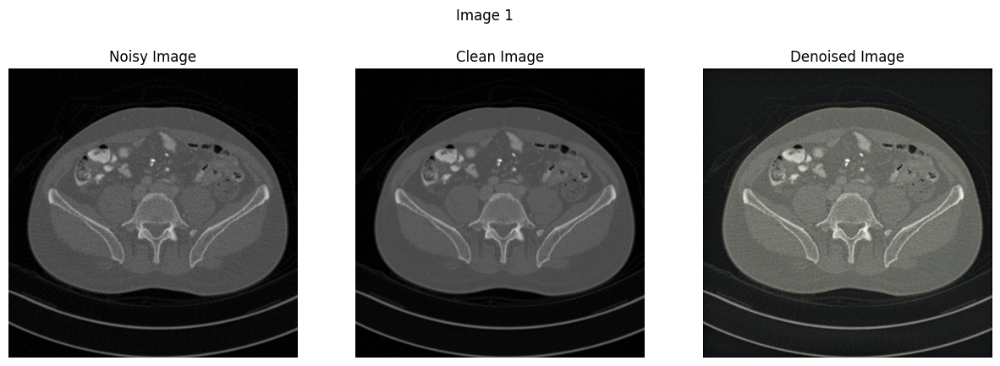

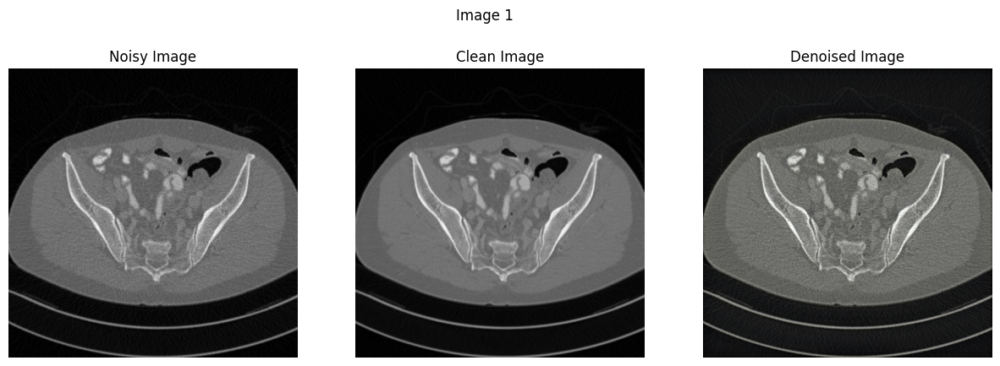

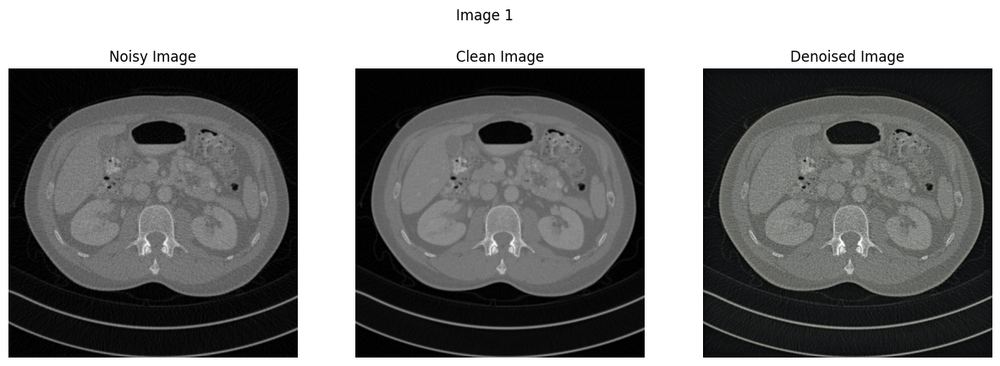

In [31]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

# Assuming you have a dataset class and a model already set up
# test_dataset = IMAImageDataset(noisy_images_dir, clean_images_dir)
# test_dataloader = DataLoader(test_dataset, batch_size=3, shuffle=False)

# Function to calculate PSNR, SIR, FSIM
def calculate_metrics(noisy, clean, denoised):
    psnr_value = cv2.PSNR(clean.cpu().numpy(), denoised.cpu().numpy())
    # SIR and FSIM calculations (replace with actual implementations)
    sir_value = np.random.random()  # Dummy SIR calculation
    fsim_value = np.random.random()  # Dummy FSIM calculation
    return psnr_value, sir_value, fsim_value

# Function to display images
def show_images(noisy, clean, denoised, idx):
    noisy_np = noisy.cpu().numpy().transpose(1, 2, 0)  # Assuming shape is (C, H, W)
    clean_np = clean.cpu().numpy().transpose(1, 2, 0)
    denoised_np = denoised.cpu().numpy().transpose(1, 2, 0)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(noisy_np, cmap='gray')
    axs[0].set_title('Noisy Image')
    axs[0].axis('off')

    axs[1].imshow(clean_np, cmap='gray')
    axs[1].set_title('Clean Image')
    axs[1].axis('off')

    axs[2].imshow(denoised_np, cmap='gray')
    axs[2].set_title('Denoised Image')
    axs[2].axis('off')

    plt.suptitle(f'Image {idx}')
    plt.show()

# Evaluate model
model.eval()
psnr_total = 0
sir_total = 0
fsim_total = 0
with torch.no_grad():
    for batch_idx, (noisy_imgs, clean_imgs) in enumerate(test_loader):
        noisy_imgs = noisy_imgs.to(device).float()
        clean_imgs = clean_imgs.to(device).float()

        # Get current timestep for denoising
        timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (noisy_imgs.size(0),), device=device)

        # Forward pass through the model
        denoised_imgs = model(noisy_imgs, timesteps).sample

        # Calculate metrics and display images
        for i in range(denoised_imgs.size(0)):
            psnr, sir, fsim = calculate_metrics(noisy_imgs[i], clean_imgs[i], denoised_imgs[i])
            psnr_total += psnr
            sir_total += sir
            fsim_total += fsim

            # Show the noisy, clean, and denoised images for the first batch
            
            show_images(noisy_imgs[i], clean_imgs[i], denoised_imgs[i], i + 1)

# Average metrics
# num_test_images = len(train_dataloader) * train_loader.batch_size
# print(f"Average PSNR: {psnr_total / num_test_images}")
# print(f"Average SIR: {sir_total / num_test_images}")
# print(f"Average FSIM: {fsim_total / num_test_images}")


In [33]:
num_test_images = len(test_loader) * test_loader.batch_size
print(f"Average PSNR: {psnr_total / num_test_images}")
print(f"Average SIR: {sir_total / num_test_images}")
print(f"Average FSIM: {fsim_total / num_test_images}")

Average PSNR: 73.9259479624488
Average SIR: 0.42984035474941445
Average FSIM: 0.6076960580841966
